In [2]:
from io import BytesIO
from zipfile import ZipFile
from urllib.request import urlopen
import geopandas as gpd
from io import StringIO
# or: requests.get(url).content
from shapely.geometry import Point, LineString
import boto3
import pandas as pd

In [ ]:
resp = urlopen("https://developer.trimet.org/gis/data/tm_boundary.zip")
myzip = ZipFile(BytesIO(resp.read()))
myzip.extractall('gis/export/')

In [2]:
resp = urlopen("https://developer.trimet.org/schedule/gtfs.zip")
myzip = ZipFile(BytesIO(resp.read()))
myzip.extractall('gtfs/')

In [3]:
gtfs_routes = pd.read_csv('gtfs/routes.txt')
gtfs_routes.head(3)

,route_id,agency_id,route_short_name,route_long_name,route_type,route_url,route_color,route_text_color,route_sort_order
0,1,TRIMET,1,Vermont,3,https://trimet.org/schedules/r001.htm,NaN,NaN,400
1,2,TRIMET,FX2,Division,3,https://trimet.org/schedules/r002.htm,61A60E,FFFFFF,500
2,4,TRIMET,4,Fessenden,3,https://trimet.org/schedules/r004.htm,NaN,NaN,600


In [4]:
gtfs_routes[['route_id','route_short_name','route_long_name']].to_json('gtfs/gtfs_routes.json',orient='records')

In [6]:
client = boto3.client("s3")
client.upload_file("gtfs/gtfs_routes.json", "meysohn-sandbox", "trimet_trip_planner/gtfs_routes.json",ExtraArgs={'ACL':'public-read'})

Make routes from `shapes.txt` file

In [5]:
gtfs_shapes = pd.read_csv('gtfs/shapes.txt')
gtfs_shapes.head(3)

,shape_id,shape_pt_lat,shape_pt_lon,shape_pt_sequence,shape_dist_traveled
0,535813,45.522879,-122.677388,1,0.0
1,535813,45.522913,-122.677396,2,12.6
2,535813,45.522988,-122.677431,3,41.3


In [6]:
gtfs_shapes['vertex_point'] = [Point(x, y) for x, y in zip(gtfs_shapes['shape_pt_lon'].to_numpy(),gtfs_shapes['shape_pt_lat'].to_numpy())]

/Users/benjaminmalnor/.pyenv/versions/miniconda3-latest/envs/geo-analysis/lib/python3.10/site-packages/pandas/core/dtypes/cast.py:127: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


Make shape vertices into shape lines

In [7]:
gtfs_shape_lines = gtfs_shapes.groupby('shape_id')[['vertex_point']].agg(lambda x: LineString(list(x))).reset_index()

In [8]:
gtfs_shape_lines_gdf = gpd.GeoDataFrame(gtfs_shape_lines, crs="EPSG:4326", geometry='vertex_point')
gtfs_shape_lines_gdf.head(3)

,shape_id,vertex_point
0,535813,"LINESTRING (-122.67739 45.52288, -122.67740 45..."
1,535814,"LINESTRING (-122.72189 45.47623, -122.72236 45..."
2,535815,"LINESTRING (-122.67586 45.52807, -122.67574 45..."


In [9]:
gtfs_shape_lines_gdf.iloc[:10].explore()

In [10]:
gtfs_shape_lines_gdf.shape

(1004, 2)

In [11]:
gtfs_trips = pd.read_csv('gtfs/trips.txt')
gtfs_trips.head(3)

,route_id,service_id,trip_id,trip_short_name,direction_id,block_id,shape_id,trip_type,wheelchair_accessible
0,1,W.647,12336459,NaN,0,6174,535813,NaN,1
1,1,W.647,12336460,NaN,0,6470,535813,NaN,1
2,1,W.647,12336461,NaN,1,6169,535814,NaN,1


In [12]:
route_shapes = gtfs_trips.groupby(['route_id','shape_id']).agg(num_trips=('trip_id','nunique')).reset_index()
route_shapes.head(3)

,route_id,shape_id,num_trips
0,1,535813,2
1,1,535814,2
2,1,537563,4


## How to handle multiple shapes per route. 
I'm thinking take union of shapes?

In [13]:
shapes_lines_w_route = gtfs_shape_lines_gdf.merge(route_shapes[['route_id','shape_id']], how='inner', on='shape_id')
shapes_lines_w_route.head(3)

,shape_id,vertex_point,route_id
0,535813,"LINESTRING (-122.67739 45.52288, -122.67740 45...",1
1,535814,"LINESTRING (-122.72189 45.47623, -122.72236 45...",1
2,535815,"LINESTRING (-122.67586 45.52807, -122.67574 45...",2


In [14]:
from shapely.ops import unary_union

In [15]:
shapes_lines_w_route.groupby('route_id').agg(shape_count=('shape_id','nunique')).reset_index().sort_values('shape_count', ascending=True)

,route_id,shape_count
78,98,3
9,13,3
0,1,4
24,30,4
31,37,4
...,...,...
5,9,28
4,8,28
75,94,34
8,12,39


In [16]:
shapes_lines_w_route_reduced = shapes_lines_w_route.groupby('route_id')[['vertex_point']].agg(lambda x: unary_union(x)).reset_index()

/Users/benjaminmalnor/.pyenv/versions/miniconda3-latest/envs/geo-analysis/lib/python3.10/site-packages/pandas/core/ops/array_ops.py:75: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  result = libops.scalar_compare(x.ravel(), y, op)


In [17]:
shapes_lines_w_route_reduced.columns

Index(['route_id', 'vertex_point'], dtype='object')

In [18]:
shapes_lines_w_route_reduced.set_geometry('vertex_point', inplace=True)
shapes_lines_w_route_reduced.set_crs("EPSG:4326", inplace=True)

,route_id,vertex_point
0,1,"MULTILINESTRING ((-122.67739 45.52288, -122.67..."
1,2,"MULTILINESTRING ((-122.67586 45.52807, -122.67..."
2,4,"MULTILINESTRING ((-122.67957 45.51475, -122.67..."
3,6,"MULTILINESTRING ((-122.69305 45.51762, -122.69..."
4,8,"MULTILINESTRING ((-122.67530 45.52776, -122.67..."
...,...,...
89,200,"MULTILINESTRING ((-122.68369 45.50962, -122.68..."
90,203,"MULTILINESTRING ((-122.80112 45.49062, -122.80..."
91,208,"MULTILINESTRING ((-122.68392 45.49950, -122.67..."
92,290,"MULTILINESTRING ((-122.63505 45.43074, -122.63..."


convert to trimet crs so we can simplify with accurate units

In [19]:
trimet_crs = "EPSG:2913"
shapes_lines_w_route_proj = shapes_lines_w_route_reduced.to_crs(trimet_crs)

In [20]:
shapes_lines_w_route_proj['simplified_lines'] = shapes_lines_w_route_proj['vertex_point'].simplify(500)

In [21]:
simply_lines_with_routes = shapes_lines_w_route_proj.set_geometry("simplified_lines").to_crs("EPSG:4326")

In [22]:
simply_lines_with_routes.explore()

In [23]:
simply_lines_with_routes_name = simply_lines_with_routes[['route_id','simplified_lines']].merge(gtfs_routes[['route_id','route_long_name']], how='inner', on='route_id')

In [24]:
simply_lines_with_routes_name.head(3)

,route_id,simplified_lines,route_long_name
0,1,"MULTILINESTRING ((-122.67739 45.52288, -122.67...",Vermont
1,2,"MULTILINESTRING ((-122.67586 45.52807, -122.67...",Division
2,4,"MULTILINESTRING ((-122.67957 45.51475, -122.67...",Fessenden


In [83]:
simply_lines_with_routes_name.to_file("gis/export/simply_lines_with_routes_name.geojson", driver="GeoJSON")

In [86]:
for route_id in simply_lines_with_routes_name['route_id'].unique():
    one_route = simply_lines_with_routes_name[simply_lines_with_routes_name['route_id']==route_id].copy()
    one_route.to_file(f"gis/export/route_shapes/route_line_{route_id}.geojson", driver="GeoJSON")
    client = boto3.client("s3")
    client.upload_file(f"gis/export/route_shapes/route_line_{route_id}.geojson", "meysohn-sandbox", f"trimet_trip_planner/route_lines/route_line_{route_id}.geojson",ExtraArgs={'ACL':'public-read'})

## Buffer lines

In [25]:
tm_routes_proj = simply_lines_with_routes_name.to_crs("EPSG:2913")

In [28]:
# make distance same as trip planner config
tm_routes_proj['buffer_geometry'] = tm_routes_proj['simplified_lines'].apply(lambda x: x.buffer(1600))

In [29]:
tm_routes_buffer = gpd.GeoDataFrame(tm_routes_proj.drop('simplified_lines', axis=1), crs="EPSG:2913", geometry="buffer_geometry")

In [30]:
tm_routes_buffer_view = tm_routes_buffer.to_crs("EPSG:4326")

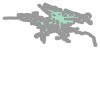

In [31]:
tm_routes_buffer_union = tm_routes_buffer_view.unary_union
tm_routes_buffer_union

In [33]:
tm_route_boundaries = pd.DataFrame([['trimet_route_buffer_boundary']],columns=['description'])
tm_route_boundaries_gpd = gpd.GeoDataFrame(tm_route_boundaries, crs="EPSG:4326", geometry=[tm_routes_buffer_union])

In [34]:
tm_route_boundaries_gpd.explore()

In [35]:
tm_route_boundaries_gpd.to_file("../tm_route_buffer_bounds.geojson", driver="GeoJSON")